# <u>🧠 Image Enhancement Using SRCNN Deep Learning Model 🧠

# <u>1) Introduction</u>

In this task, I will be implementing the
[Super Resolution Convolutional Neural Network(SRCNN)](https://arxiv.org/abs/1501.00092)
by Chao Dong, Chen Change Loy, Kaiming He and Xiaoou Tang.

SRCNN proposes a 3 layer CNN for image super-resolution. It is one of the first papers to apply deep neural networks for the task of image super-resolution. The SRCNN architecture is composed of three components: Feature extractor, non-linear mapping, reconstruction. The model is trained to minimize the pixel-wise MSE between the reconstructed and ground truth image.

## <u>1.1)Model Architecture</u>

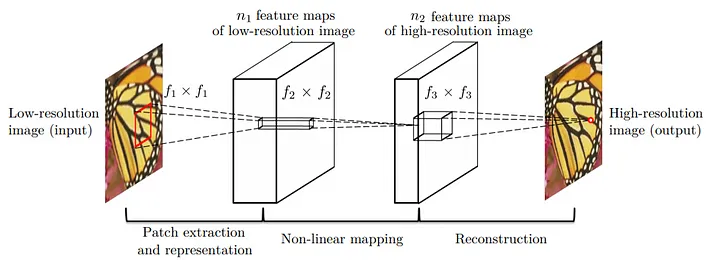

The proposed architecture conceptually consists of 3 components: Feature extractor, non-linear mapping, reconstruction. Each are responsible for extracting low-resolution features, mapping into high resoltion features, reconstruction. The low resolution image is an image introduced with blurring and different kinds of noises simulating real situations , let this LR Image be X, with the same size as the high resolution image, Y. The model aims to learn a mapping F: X->Y.

Conclusively, each component turns out to be represented as one convolution layer, resulting a 3-layer convolutional neural network, with kernel size 9–1–5. According to the figure below, the intermediate outputs of each layer seems to contain the necessary information they are expected to compute.

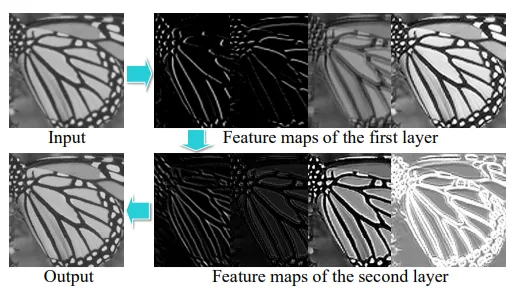

## <u>1.2)Loss</u>

The loss fuction is defined as the pixel wise MSE(Mean Squared Error) between the reconstructed image F(Y) and the ground truth image X. This will result in training to maximizing the PSNR measure.

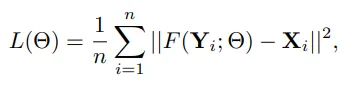

## <u>1.3)Experiments</u>

The paper experiments various hyper-parameter settings to improve performance. The figure below shows how a network channel sizes of 9–1-5 outperforms other settings, and that deeper networks that increase the capability of the non-linear mapping based on the 3-stage methodology of the paper were unnecessary. Although the concept of the proposed model has some known flaws proven to be false by further research in deep learning, the experiments shows the high performance of the proposed 3-stage methodology for SR.

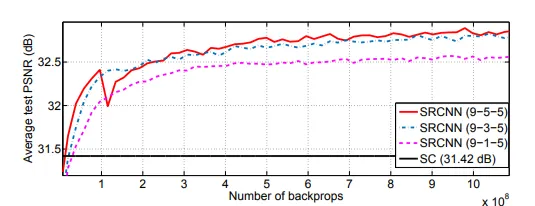

# <u>2)Implementation</u>

## <u>2.1) Importing Packages</u>

In this task, I'll be using the following packages which will aid greatly in my work:
* Tensorflow 2.0 & Keras for Constructing the Neural Network, the loss function and the optimizer, as well as training and prediction.
* Numpy for dealing with matrices, although at times they will be converted into tf.Tensor objects to be used by TensorFlow package.
* Matplotlib for Visualization purposes.
* OpenCV mainly for importing data and preprocessing phase of the pipeline.

In [3]:
import os 
import re 
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array
from skimage.transform import resize, rescale
import matplotlib.pyplot as plt
import numpy as np
import cv2
from keras import layers
from tensorflow.keras.layers import Input,Conv2D
from tensorflow.keras.layers import Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
np.random.seed(2)

print(tf.__version__)

2.12.0


## <u>2.2) Loading the data</u>

The following cell goes as follows:
* sorted_alphanumeric: This function sorts a list of strings in an alphanumeric order. This means that the strings are ordered by their numerical and alphabetical components. For example, if the input data is ['a1', 'a10', 'a2', 'b1', 'b11', 'b2'], the output will be ['a1', 'a2', 'a10', 'b1', 'b2', 'b11']. The function works by defining two helper functions: convert and alphanum_key. The convert function takes a text as an argument and returns an integer if the text is a digit, or a lowercase string otherwise. The alphanum_key function takes a key as an argument and returns a list of converted components by splitting the key on digits. For example, alphanum_key('a10') will return ['a', 10]. The function then uses the built-in sorted function to sort the data list by the alphanum_key function. This ensures that the strings are compared by their numerical and alphabetical parts, rather than by their ASCII values.

* Chose a size of 256 for all the images in the dataset for 2 purposes: as a means of standardization of the data into a fixed shape to be fed into the SRCNN Model, and also as a way of improving memory usage during the training of the model.

* Resided to an amount of 885 images per each set, HR set and LR set, Mainly due to Memory usage issues during training, a solution to this would be a custom data generator but due to limited time i focused mainly on performing the whole pipeline till completion.

* Had to convert the images to datatype of float32 for multiple reasons, mostly due to visualization issues with matplotlib.

* Created 2 datasets, high_img regarding the HR Images and low_img for LR Images.

In [4]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = '/kaggle/input/image-enhancement-dataset-1/sharped_images'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in files:  
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing images for standardization and performance
        img = cv2.resize(img, (SIZE, SIZE))
        #use float32 type to attain float range [0.0:1.0]
        img = img.astype('float32')
        high_img.append(img_to_array(img))


low_img = []
path = '/kaggle/input/image-enhancement-dataset-1/blurred_images'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in files:
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32')
        low_img.append(img_to_array(img))

## <u>2.3) Exploratory Data analysis</u>

In this dataset, Various kinds of noises are introduced as you can see in the following visualization of the dataset, including blurring, circular noises, salt and pepper, also there is a variation in the background color of the images, not sure if this would be considered as a problem during training but surely i've kept an eye on it, also, according to visualization on multiple Images's histogram, and it can also be seen clearly from the images, that many of the images' intensity spectrum resides on the higher end of the [0:255] interval, many of these issues will be addressed in the following preprocessing steps.

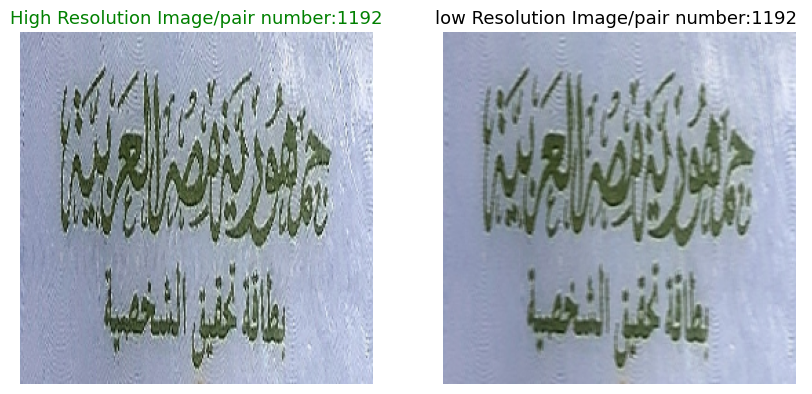

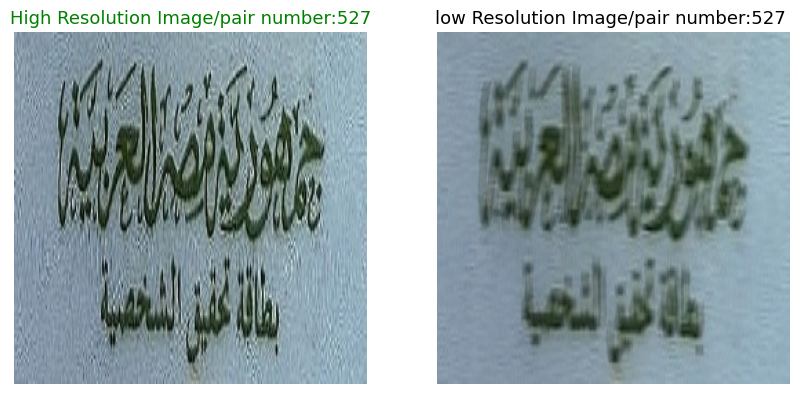

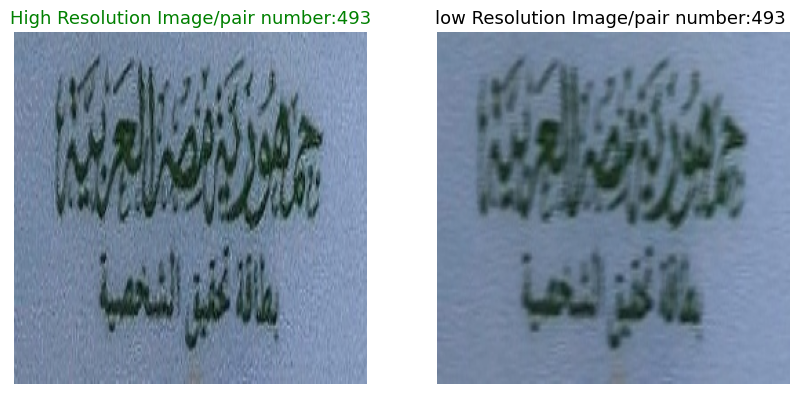

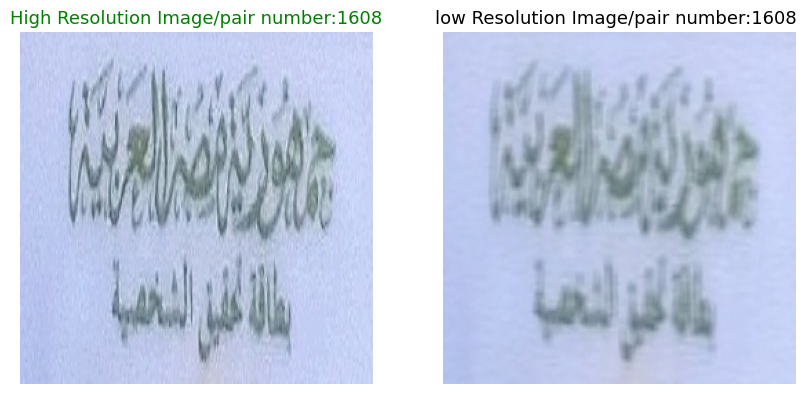

In [5]:
for i in range(4):
    #Random integer generator for randomizing images plotting
    a = np.random.randint(2029)
    #Creating a figure to construct subplots for images within
    plt.figure(figsize=(10,10))
    #high resolution images subplot
    plt.subplot(1,2,1)
    plt.title(f'High Resolution Image/pair number:{a}', color = 'green', fontsize = 13)
    plt.imshow(high_img[a]/255.0)
    plt.axis('off')
    #low resolution images subplot
    plt.subplot(1,2,2)
    plt.title(f'low Resolution Image/pair number:{a} ', color = 'black', fontsize = 13)
    plt.imshow(low_img[a]/255.0)
    plt.axis('off')
    plt.savefig('plot.png', transparent=True, bbox_inches='tight')

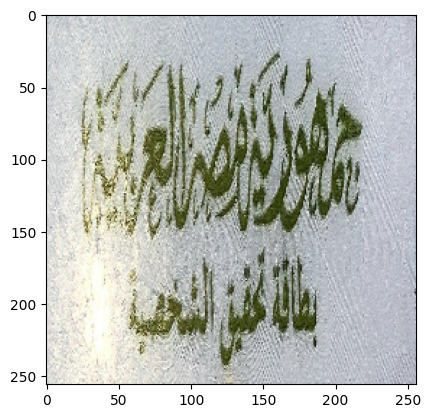

In [6]:
plt.imshow(high_img[22]/255.0)
plt.show()

In [7]:
meanh = []
meanl = []
medianh = []
medianl = []
maximumh = []
maximuml = []
minimumh = []
minimuml = []
for i in range(len(high_img)):
    mean_i_high = np.mean(high_img[i])
    mean_i_low = np.mean(low_img[i])
    meanh.append(mean_i_high)
    meanl.append(mean_i_low)

for i in range(len(high_img)):
    median_i_high = np.median(high_img[i])
    median_i_low = np.median(low_img[i])
    medianh.append(median_i_high)
    medianl.append(median_i_low)

for i in range(len(high_img)):
    max_i_high = np.max(high_img[i])
    max_i_low = np.max(low_img[i])
    maximumh.append(max_i_high)
    maximuml.append(max_i_low)

for i in range(len(high_img)):
    min_i_high = np.min(high_img[i])
    min_i_low = np.min(low_img[i])
    minimumh.append(min_i_high)
    minimuml.append(min_i_low)

print(meanh)


[210.40508, 198.62685, 179.77397, 141.19044, 166.86168, 174.69267, 181.01843, 175.34258, 175.28235, 158.49829, 194.15863, 154.27354, 159.19374, 137.31853, 170.19748, 159.77916, 152.85, 192.81581, 180.76672, 174.2812, 167.28352, 159.91948, 177.35297, 163.35774, 185.72948, 165.05049, 171.21507, 170.82259, 156.81667, 138.80695, 181.58528, 164.83556, 160.0512, 151.9007, 161.30177, 156.10962, 198.34694, 195.48558, 199.24602, 210.7378, 205.83882, 174.82709, 198.53772, 152.09639, 203.77931, 181.12245, 183.61052, 175.14641, 196.86702, 143.58205, 166.37462, 206.77228, 161.43053, 155.38191, 177.0675, 210.43695, 145.07074, 152.50162, 158.48909, 153.12154, 206.10014, 160.95038, 178.69531, 207.25804, 197.4209, 178.95009, 160.08124, 192.20937, 189.89629, 166.26051, 158.94911, 186.992, 206.49281, 196.30739, 173.47992, 191.64955, 188.8872, 145.89214, 191.49524, 165.02223, 200.30151, 178.54767, 192.68152, 140.02551, 199.31, 151.44714, 207.20143, 169.18254, 158.41344, 151.83147, 143.58826, 182.90483, 17

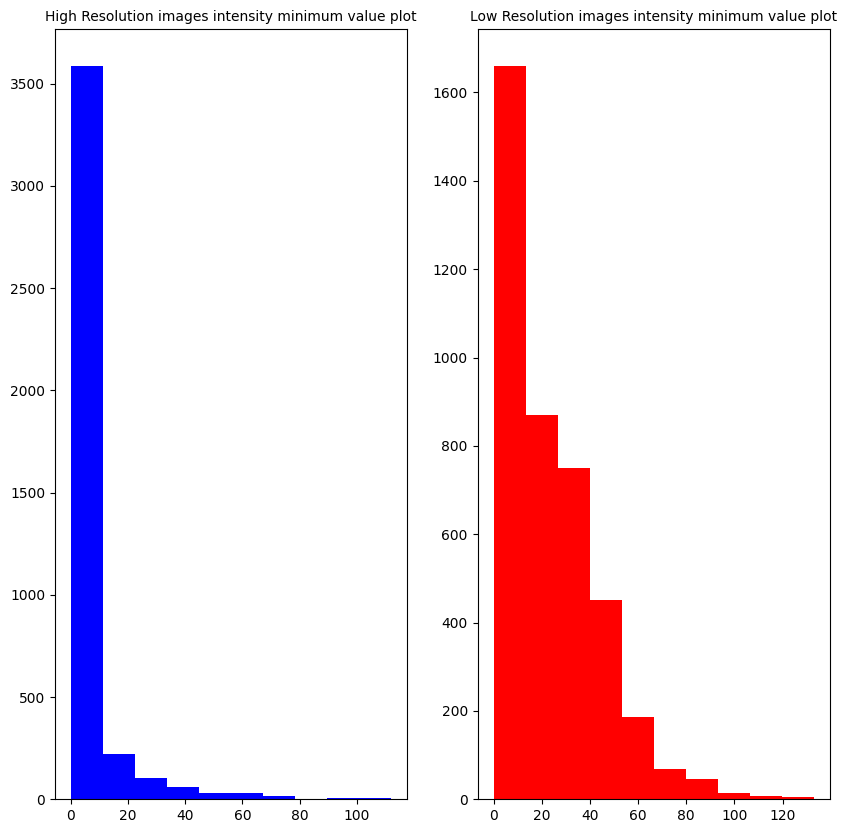

In [8]:
plt.figure(figsize=(10,10))
#high resolution
plt.subplot(1,2,1)
plt.title(f'High Resolution images intensity minimum value plot', color = 'black', fontsize = 10)
plt.hist(minimumh, color='blue')
#low resolution
plt.subplot(1,2,2)
plt.title(f'Low Resolution images intensity minimum value plot', color = 'black', fontsize = 10)
plt.hist(minimuml, color='red')
plt.savefig('plot.png', transparent=True, bbox_inches='tight')

In [9]:
#np.mean(meanh)
np.std(meanh)

20.22926

## <u>2.4) Preprocessing stage:</u>
In this Stage, we will be going through multiple subpoints, discussing what worked and what didn't, why i've chosen such approaches and how they turned out to be during training and evaluation phase.

In my appproach, i tended to make the label images (high_img array) as clear as possible with a good contrast ratio between the the foreground writings and the plain background of the ids, so that the mapping between the LR Images and the HR ones could be as easy as possible for the neural net, and this was clearly seen after performing some preprocessing on the HR set as it reflected in the strong minimization of the cost function of the model. 

I've also tried a couple of techniques on the LR Dataset but with no significance in results, mostly what happened was the opposite, a greater degradation in the percepted quality of the output images from the network and in the PSNR and MSE Values.

All the techniques that i tried were as follows:

1) Denoising: Images in this dataset had alot of noise, and it had to be removed, i used non-local means denoising for this objective and it worked quite well as you can see in the following visualization, did the same for the LR Images but gave bad results and i specify in the following section about denoising.

2) Sharpening: I've tried sharpening the HR Images but the result was not significant, gave a better output visually for the HR Images but as for the evaluation of the network outputs, the results nor the metrics differed by much, so i decided not to go with it.

3) Weighted addition: Tried performing a weighted addition between the sharpened HR Images and the smoothed denoised ones, results were pretty good visually but there were two problems, first the background and even some pixels in the foreground writings overflowed due to the pixels' values exceeding 255 and showing white pixels, and the second is a consequent of the first as the outputs exposure was very high in some images due to it learning from the overly skewed Images Histograms towards the very high end of the intensity's spectrum.

4) Histogram Equalization: Tried using Contrast Limited Adaptive Histogram Equalization (CLAHE) for Stretching the HR Images Histogram for maybe it could give better results while training by stratching out the histogram of intensities of the image, but it wasn't good either as it dimmed out the image and decreased the differences between the foreground and background which is not the goal.

the 3 techniques which i did not go with, i had code for them in this notebook below but because you asked for a clean code structure, i removed them as they are of no use but i do have them in my local notebook for your reference if you'd like.

Also, Other techniques that i still did not try but i believe they can enhance the training and evaluation of the model are:

1) Data Cleaning: I've noticed that many images in the dataset are either way too bad or way too good to be used in the training process, but given the time constraint, i decided to go with the other approaches.

2) Removing noise from HR and LR Images in the frequency domain: i've noticed that some images still have a kind of a repeating noise that is not salt and pepper but a uniform kind of noise, which lead me to the idea that maybe if i transform the images into the frequency domain, maybe i could find a way to suppress these noise components over there and transform the enahnced images back to the spatial domain.

### <u>Denoising</u>

Non-local means denoising is a technique for removing noise from images while preserving the details and textures. It works by comparing small patches of pixels around each pixel and averaging the values of similar patches. This way, the pixels that belong to the same texture or structure are smoothed together, while the pixels that belong to different features are kept distinct

It looked like this would be a suitable technique to smooth out the noisy HR images and it did work as you will see in the following visualization, also, i've tried performing the same technique on LR Images lest that i can remove the noise off them and keep them only in their blurred form, but it did actually worsen the image, degrading many of the remaining features of the photo that still defined partly the information in the blurred LR images.

Also i tried using bilateral filtering for smoothing out the noise in the LR Images while trying to preserve the apparent edges in the blurred images but with no significant result also, noise was still there.


In [10]:
# Denoising high resolution images set
for i in range(len(high_img)):
    high_img[i] = cv2.fastNlMeansDenoisingColored(high_img[i].astype("uint8"), None, 20,20,7,15).astype("float32")

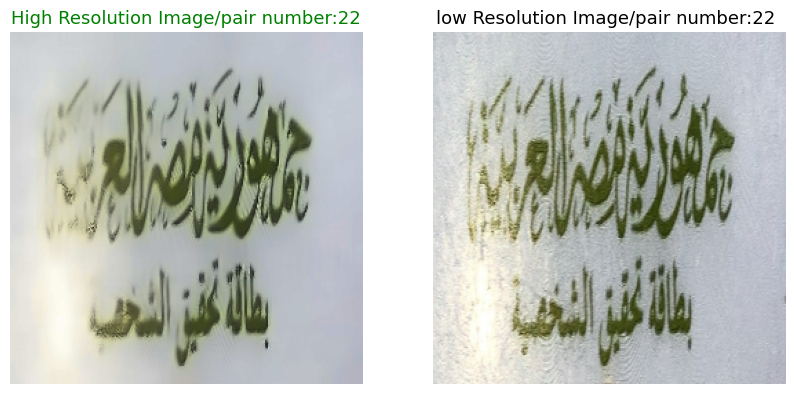

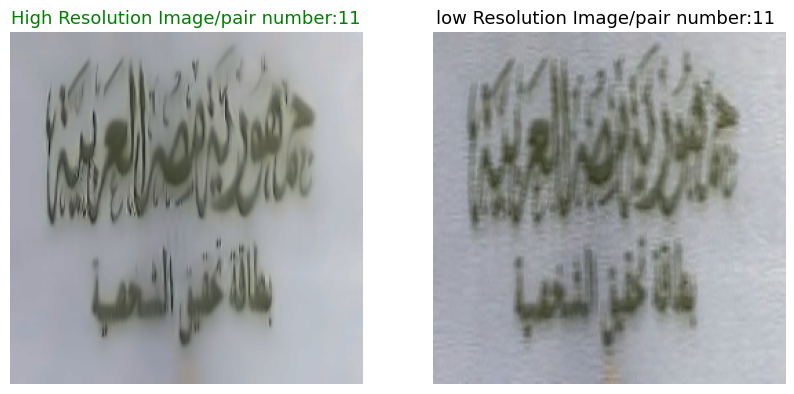

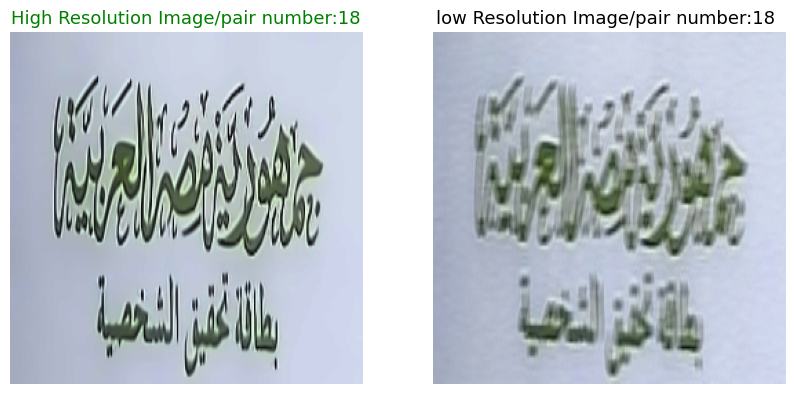

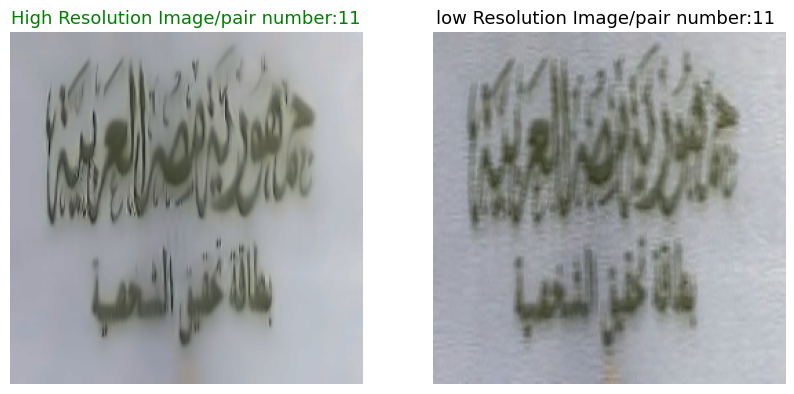

In [11]:
for i in range(4):
    a = np.random.randint(0,30)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title(f'High Resolution Image/pair number:{a}', color = 'green', fontsize = 13)
    plt.imshow(high_img[a]/255.0)
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title(f'low Resolution Image/pair number:{a} ', color = 'black', fontsize = 13)
    plt.imshow(low_img[a]/255.0)
    plt.axis('off')

## <u>2.5) Train/Val/Test Split</u>

I decided to take the splits as follows:

1) Training Set (X_train, y_train): i took 700x2 images for training (mainly for memory usage issues that could be solved by a custom data generator)

2) Validation Set (X_val, y_val): took 130x2 images for validation of the model, Keep in mind that the research paper authors had already done much of the work with much higher computational power and memory space and decided that a set of hyperparameters as we discussed in the introduction were the best for operating the model, namely the number of channels or kernels in each convolutional layer, the size of the kernels in each layer, and the number of convolutional layers in the SRCNN model, of course this is up to debate and nothing in the field of ML/DL is definite and maybe if we experimented enough we'd find different results as no one size fits all, but as a general heuristic and given the time interval within which i'm working, i decided to go with the findings of the research paper.

3) Test Set (X_test, y_test): As for the test set, i decided to go with 25 photos.

In [12]:
X_train = low_img[ : 700]
y_train = high_img[ : 700]
X_train = np.reshape(X_train,(-1,SIZE,SIZE,3)).astype("float32")/255.0
y_train = np.reshape(y_train,(-1,SIZE,SIZE,3)).astype("float32")/255.0


X_val = low_img[ 700 : 830]
y_val = high_img[ 700 : 830]
y_val= np.reshape(y_val,(-1,SIZE,SIZE,3)).astype("float32")/255.0
X_val = np.reshape(X_val,(-1,SIZE,SIZE,3)).astype("float32")/255.0


X_test = low_img[ 830 :  ]
y_test = high_img[ 830 : ]
y_test= np.reshape(y_test,(-1,SIZE,SIZE,3)).astype("float32")/255.0
X_test = np.reshape(X_test,(-1,SIZE,SIZE,3)).astype("float32")/255.0


## <u>2.5) Building the Model</u>

### <u>Defining the metrics</u>

Metrics to be used for evaluating the output images and the training performance of the model are as follows:

1) Peak Signal-to-Noise Ratio (PSNR): It is a measure of how well an image can be reconstructed after being corrupted by noise or compression. It is defined as the ratio between the maximum possible power of an image and the power of the noise that affects its quality. The higher the PSNR, the better the quality of the reconstructed image.

2) Mean Squared Error (MSE): The mean squared error is the average of the squared differences between corresponding pixels in the two images, here the two images are the reconstructed and the original HR Image.

Both these metrics aid in giving an idea of whether we're proceeding in a positive or a negative direction while training, but i did do some research into whether there could be other metrics that focused more on the output's visual quality of the image as a main objective function for the model to go after, rather than using the pixel-wise difference comparison between the reconstructed images and the original HR Images. I found that there could be such loss functions that focus on the perceptual quality rather than on the pixel-level differences, but rather focuses on the high-level features of the output image. 

In [13]:
def PSNR(y_true,y_pred):
    mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
    return 20 * log10(1/ (mse ** 0.5))
def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator
def pixel_MSE(y_true,y_pred):
    return tf.reduce_mean( (y_true - y_pred) ** 2 )

### <u>Constructing the model</u>

The model's architecture is mainly as explained in the introduction section above, and i implemented the architecture with the best hyperparameters as per the research paper using TensorFlow and Keras:

1) The first layer: Input layer which recieves the 3D LR Image as an input with a shape of (256,256,3)
2) Second Layer: Convolutional layer with 64 channels, 9x9 filters, padding same so as to preserve the edges of the image the model's working on when outputting it to the next phase, and finally the activation function which is a rectifying linear unit.
3) Third layer and fourth are the same but with different parameters

as for the loss function i chose the mse loss function as the research paper suggessted, tried mae and gave a similar result, would have liked to use PSNR as the objective function to optimize for but this function needs to be maximized not minimized.

Out of all the optimizers, i chose to go with ADAM due to it's adaptive learning rate algorithm.

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      15616     
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      2080      
                                                                 
 conv2d_2 (Conv2D)           (None, 256, 256, 3)       2403      
                                                                 
Total params: 20,099
Trainable params: 20,099
Non-trainable params: 0
_________________________________________________________________


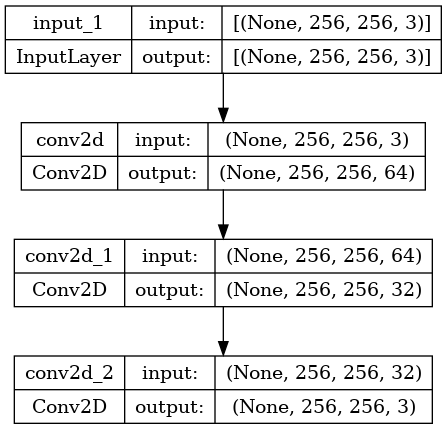

In [14]:
input_img=Input(shape=(256,256,3))
l1=tf.keras.layers.Conv2D(64,9,padding='same',activation='relu') (input_img)
l2=tf.keras.layers.Conv2D(32,1,padding='same',activation='relu') (l1)
l3=tf.keras.layers.Conv2D(3,5,padding='same',activation='relu') (l2)


SRCNN=Model(input_img,l3)
SRCNN.compile(optimizer=tf.keras.optimizers.Adam(0.0008),loss=pixel_MSE)
SRCNN.summary()
plot_model(SRCNN, to_file ='super_res.png',show_shapes=True)




### <u>Model Training</u>

If you compile the model and train it, you can see the logging of both the loss and the validation, a few points to note:

* We can see clearly that the loss does decrease rapidly for a long time until it reaches a plateau, suggessted solutions to better enhance the training is: More Data using a custom data generator that can resize the dataset into batches and pass the model batch by batch during training, this would definitely enhance the training results as it gets fed more data, hence better learning, also more preprocessing to the data may yield better results as i suggessted above in the preprocessing stage.

* The validation and the training losses are similar at first and then they start diverging but not by far, which means that the model is at good level of bias-variance ratio, neither undefitting nor overfitting.

In [15]:
SRCNN.fit(X_train, y_train, epochs = 40, batch_size = 10,
          validation_data = (X_val, y_val))

Epoch 1/40
70/70 [==============================] - 20s 58ms/step - loss: 0.0229 - val_loss: 0.0078
Epoch 2/40
70/70 [==============================] - 4s 51ms/step - loss: 0.0060 - val_loss: 0.0057
Epoch 3/40
70/70 [==============================] - 4s 51ms/step - loss: 0.0048 - val_loss: 0.0051
Epoch 4/40
70/70 [==============================] - 4s 51ms/step - loss: 0.0044 - val_loss: 0.0048
Epoch 5/40
70/70 [==============================] - 4s 51ms/step - loss: 0.0042 - val_loss: 0.0046
Epoch 6/40
70/70 [==============================] - 4s 51ms/step - loss: 0.0040 - val_loss: 0.0043
Epoch 7/40
70/70 [==============================] - 4s 51ms/step - loss: 0.0038 - val_loss: 0.0043
Epoch 8/40
70/70 [==============================] - 4s 51ms/step - loss: 0.0037 - val_loss: 0.0040
Epoch 9/40
70/70 [==============================] - 4s 52ms/step - loss: 0.0036 - val_loss: 0.0041
Epoch 10/40
70/70 [==============================] - 4s 52ms/step - loss: 0.0036 - val_loss: 0.0039
Epoch 11

In [16]:
def pixel_MSE(y_true,y_pred):
    return tf.reduce_mean( (y_true - y_pred) ** 2 )

1/1 [==============================] - 0s 192ms/step


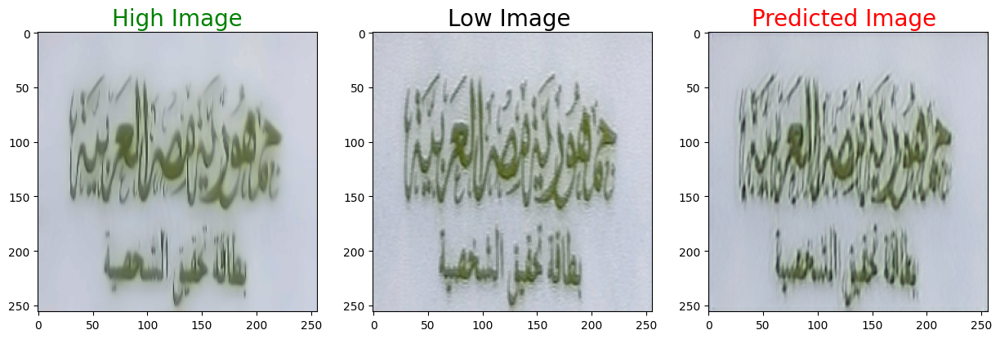

PSNR tf.Tensor(22.150738, shape=(), dtype=float32) dB MSE tf.Tensor(0.0060943305, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


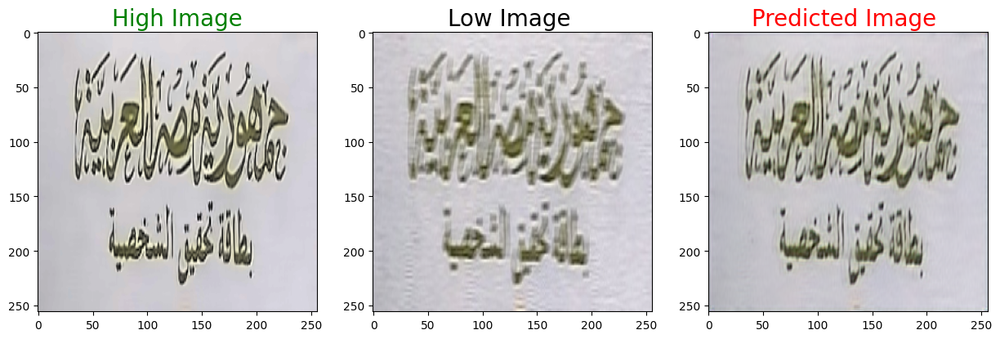

PSNR tf.Tensor(21.73622, shape=(), dtype=float32) dB MSE tf.Tensor(0.0067046806, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


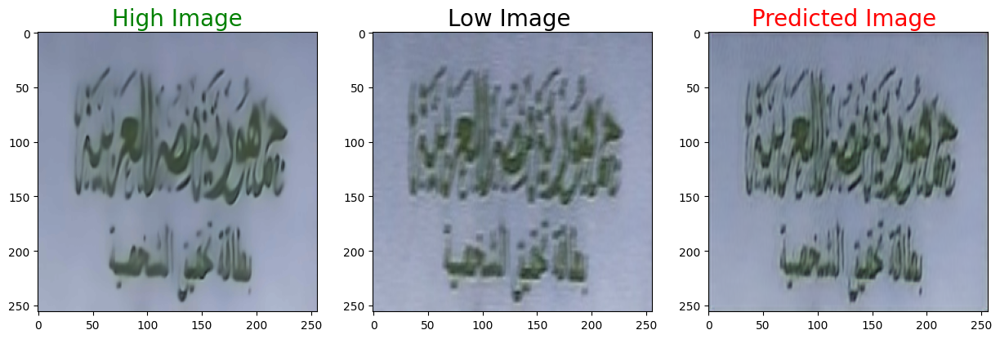

PSNR tf.Tensor(30.135725, shape=(), dtype=float32) dB MSE tf.Tensor(0.0009692311, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


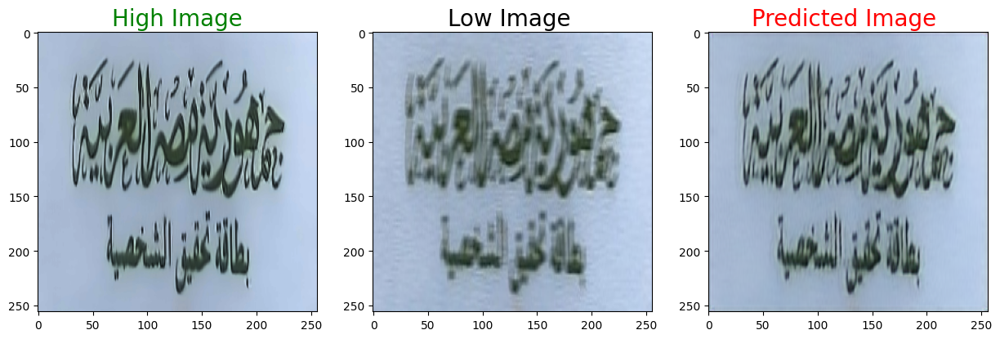

PSNR tf.Tensor(23.920345, shape=(), dtype=float32) dB MSE tf.Tensor(0.0040547643, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


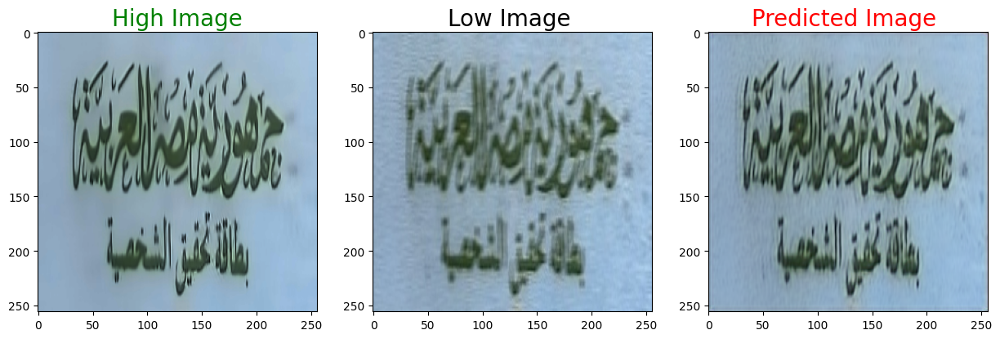

PSNR tf.Tensor(25.98733, shape=(), dtype=float32) dB MSE tf.Tensor(0.002519225, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


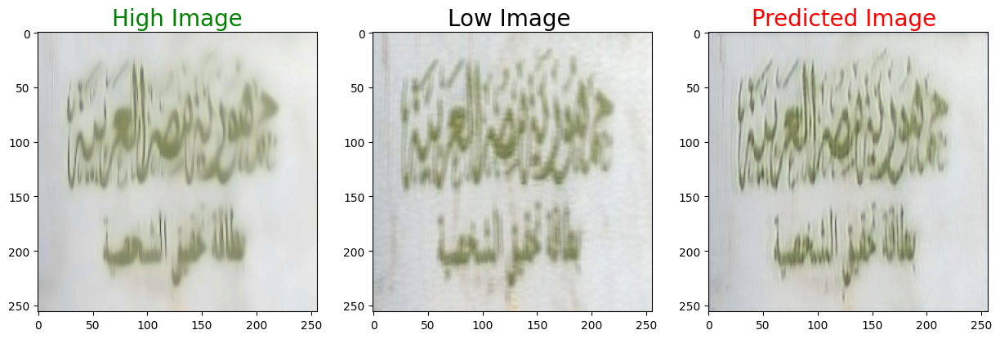

PSNR tf.Tensor(28.064482, shape=(), dtype=float32) dB MSE tf.Tensor(0.0015615349, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


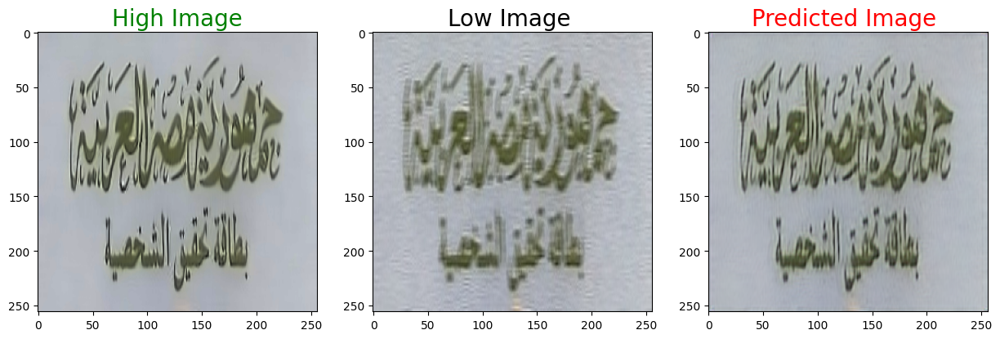

PSNR tf.Tensor(25.620413, shape=(), dtype=float32) dB MSE tf.Tensor(0.0027413133, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


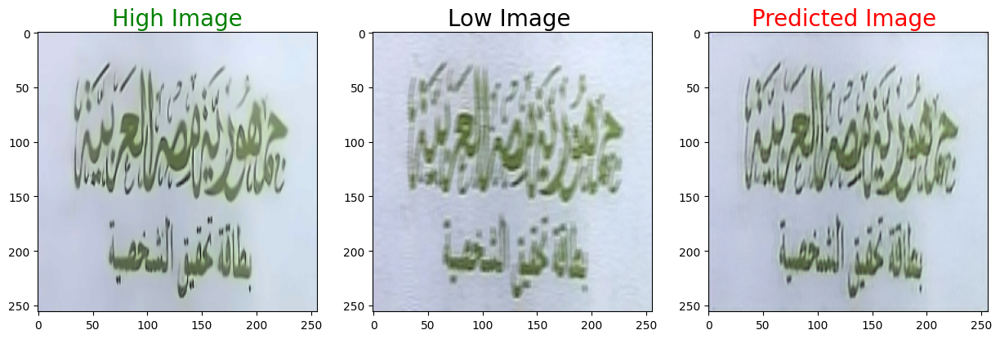

PSNR tf.Tensor(26.640465, shape=(), dtype=float32) dB MSE tf.Tensor(0.0021674717, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


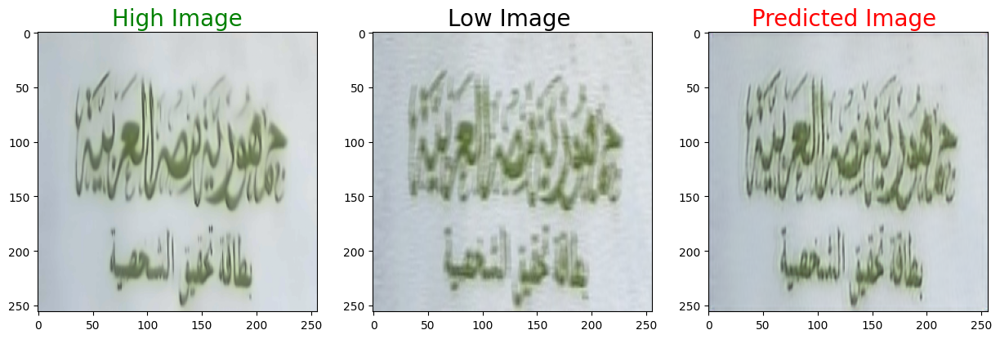

PSNR tf.Tensor(28.07676, shape=(), dtype=float32) dB MSE tf.Tensor(0.001557127, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


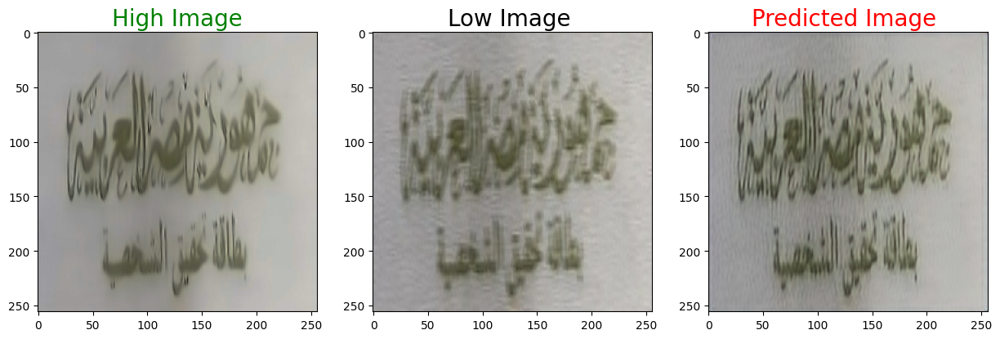

PSNR tf.Tensor(28.722067, shape=(), dtype=float32) dB MSE tf.Tensor(0.0013421262, shape=(), dtype=float32)
1/1 [==============================] - 0s 19ms/step


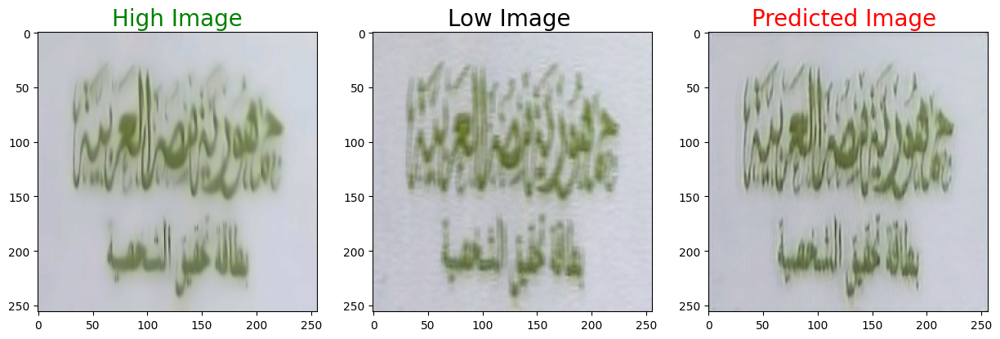

PSNR tf.Tensor(28.675993, shape=(), dtype=float32) dB MSE tf.Tensor(0.0013564402, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


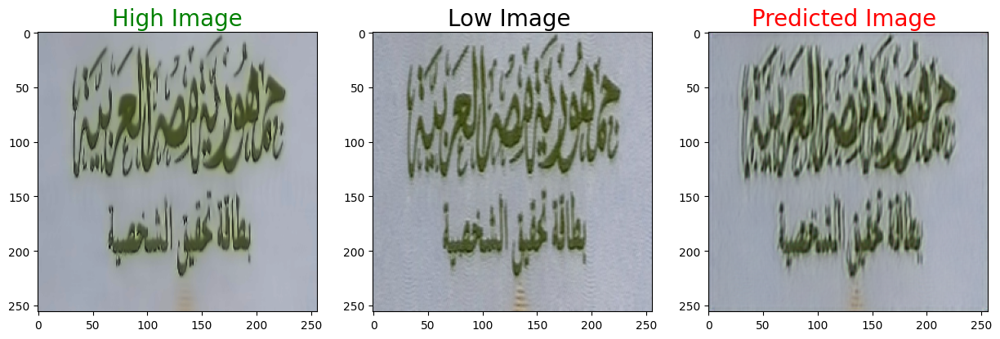

PSNR tf.Tensor(21.12128, shape=(), dtype=float32) dB MSE tf.Tensor(0.0077245273, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


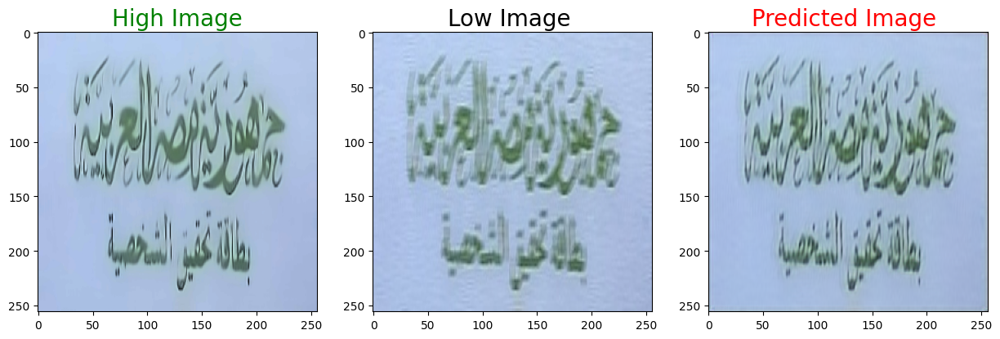

PSNR tf.Tensor(25.924812, shape=(), dtype=float32) dB MSE tf.Tensor(0.0025557529, shape=(), dtype=float32)
1/1 [==============================] - 0s 21ms/step


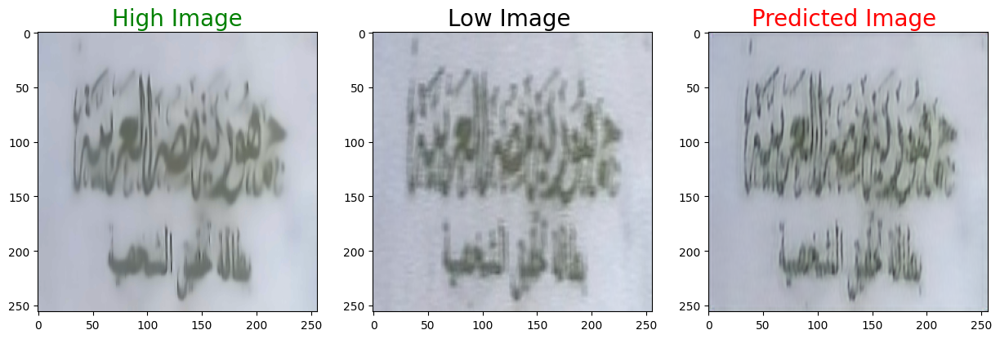

PSNR tf.Tensor(28.903196, shape=(), dtype=float32) dB MSE tf.Tensor(0.001287302, shape=(), dtype=float32)
1/1 [==============================] - 0s 21ms/step


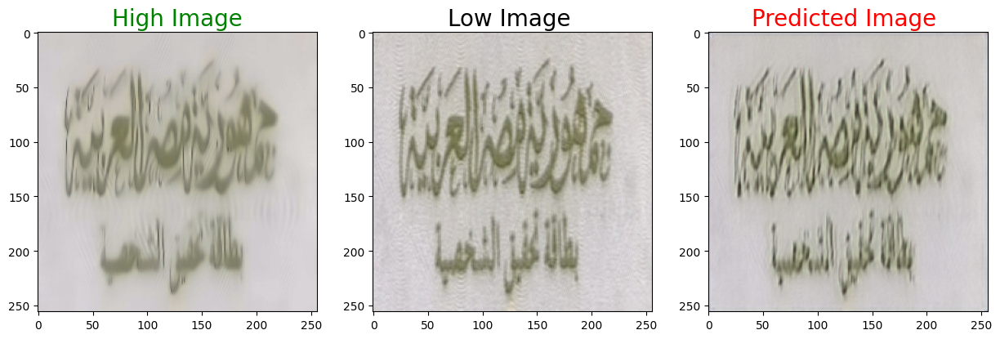

PSNR tf.Tensor(23.963264, shape=(), dtype=float32) dB MSE tf.Tensor(0.0040148874, shape=(), dtype=float32)
1/1 [==============================] - 0s 19ms/step


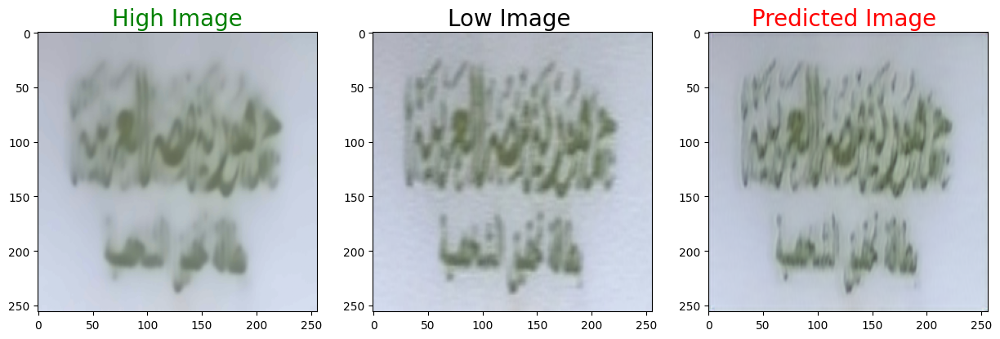

PSNR tf.Tensor(31.489353, shape=(), dtype=float32) dB MSE tf.Tensor(0.00070968346, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


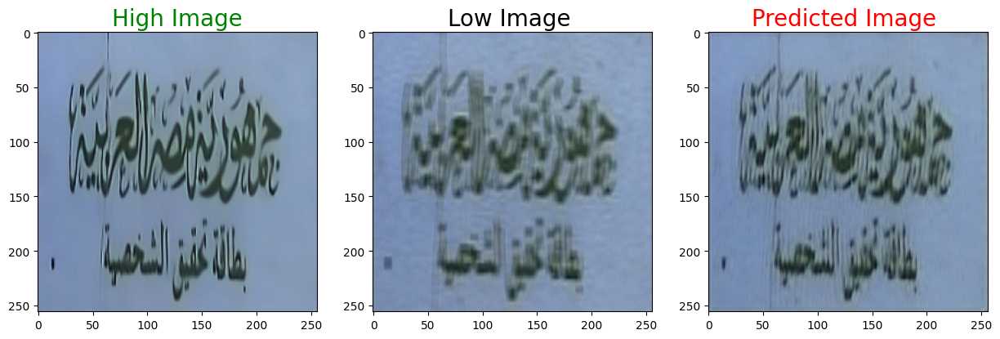

PSNR tf.Tensor(24.688496, shape=(), dtype=float32) dB MSE tf.Tensor(0.0033974284, shape=(), dtype=float32)
1/1 [==============================] - 0s 22ms/step


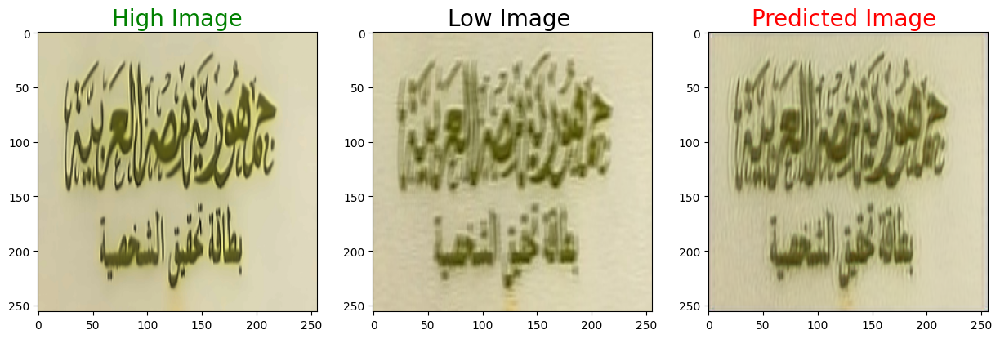

PSNR tf.Tensor(22.955437, shape=(), dtype=float32) dB MSE tf.Tensor(0.0050635645, shape=(), dtype=float32)
1/1 [==============================] - 0s 21ms/step


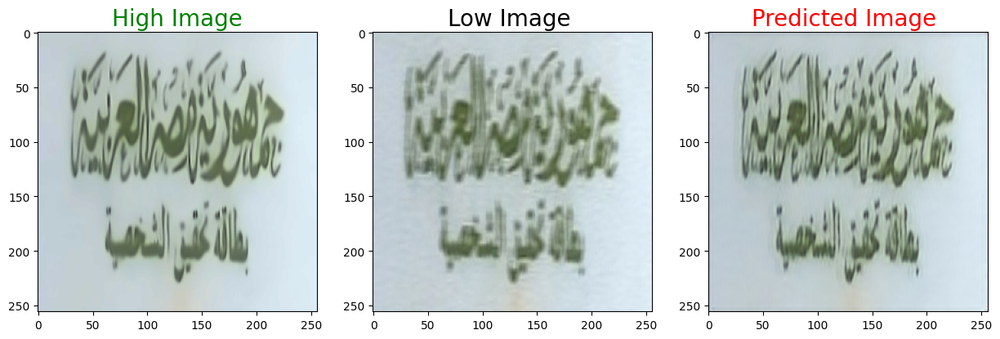

PSNR tf.Tensor(28.15696, shape=(), dtype=float32) dB MSE tf.Tensor(0.0015286353, shape=(), dtype=float32)
1/1 [==============================] - 0s 19ms/step


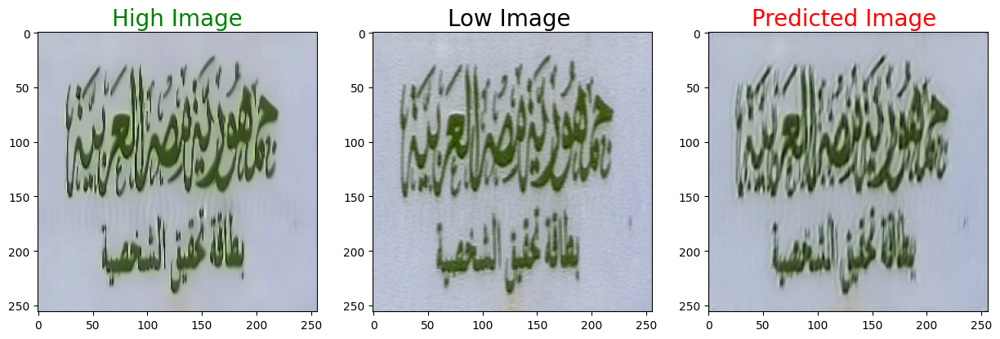

PSNR tf.Tensor(20.007713, shape=(), dtype=float32) dB MSE tf.Tensor(0.009982258, shape=(), dtype=float32)
1/1 [==============================] - 0s 19ms/step


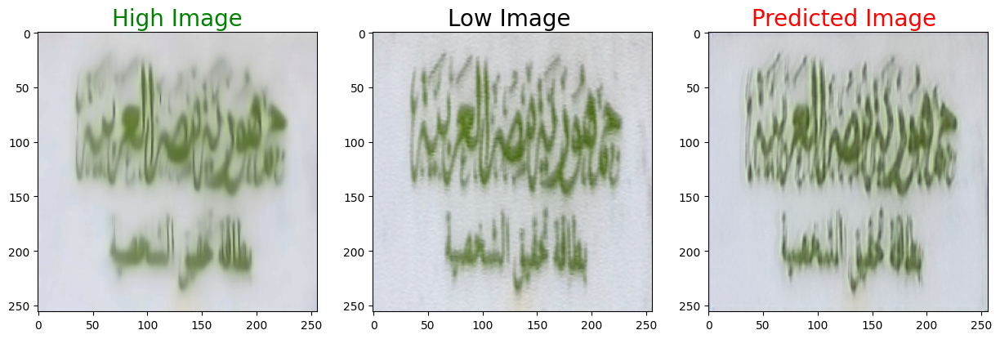

PSNR tf.Tensor(24.59312, shape=(), dtype=float32) dB MSE tf.Tensor(0.0034728653, shape=(), dtype=float32)
1/1 [==============================] - 0s 21ms/step


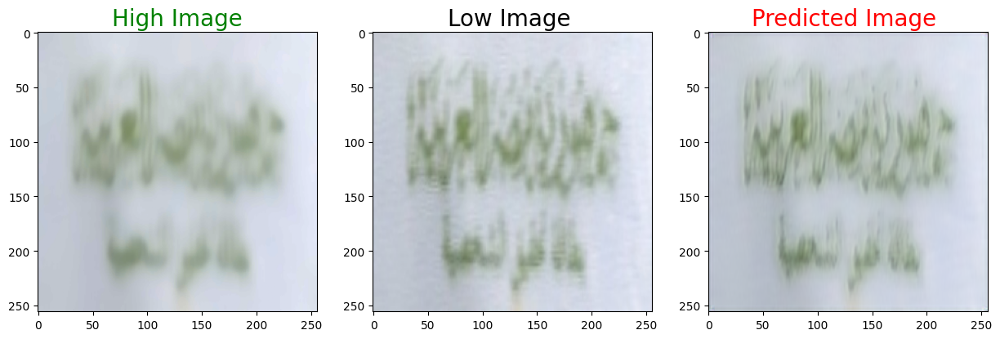

PSNR tf.Tensor(33.099678, shape=(), dtype=float32) dB MSE tf.Tensor(0.0004898148, shape=(), dtype=float32)
1/1 [==============================] - 0s 20ms/step


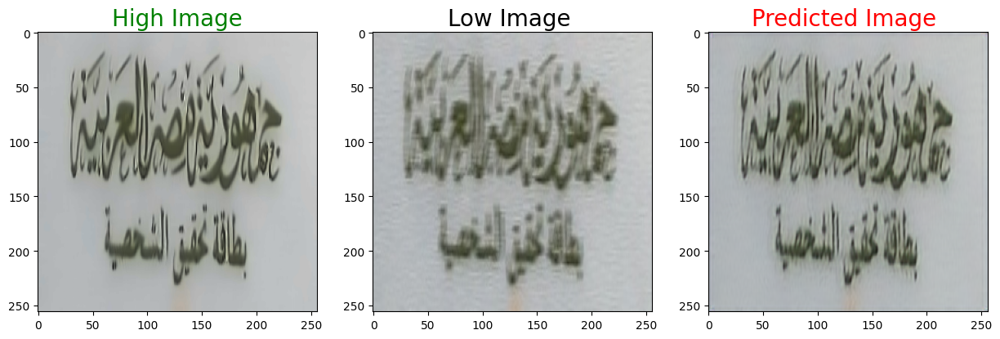

PSNR tf.Tensor(26.933615, shape=(), dtype=float32) dB MSE tf.Tensor(0.002025996, shape=(), dtype=float32)
1/1 [==============================] - 0s 21ms/step


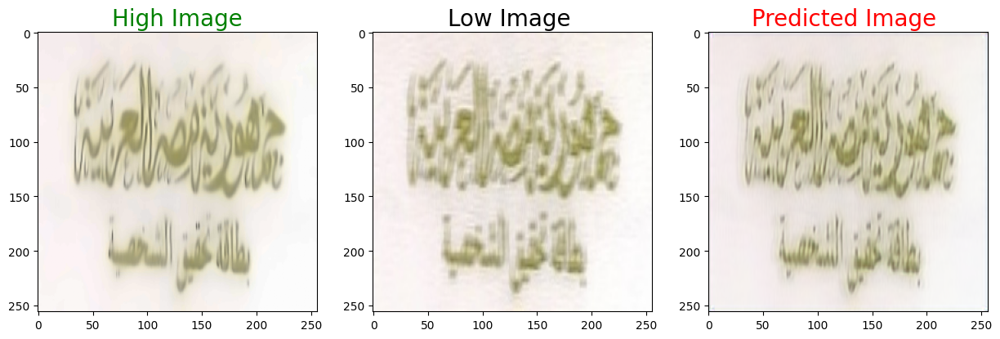

PSNR tf.Tensor(28.625793, shape=(), dtype=float32) dB MSE tf.Tensor(0.0013722103, shape=(), dtype=float32)
1/1 [==============================] - 0s 21ms/step


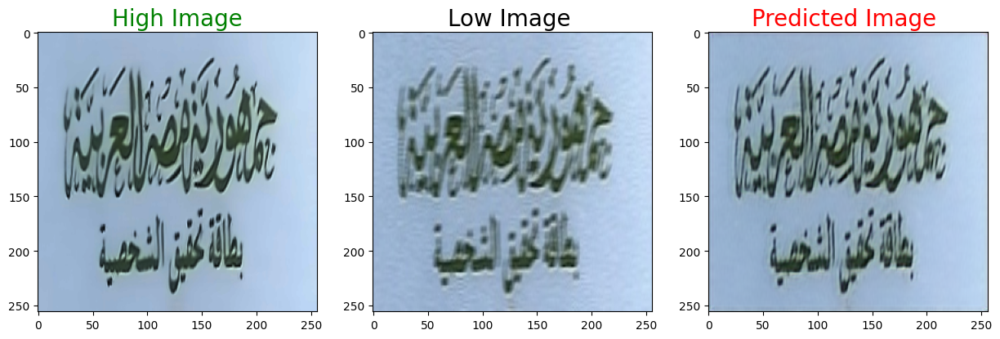

PSNR tf.Tensor(26.805706, shape=(), dtype=float32) dB MSE tf.Tensor(0.0020865528, shape=(), dtype=float32)


In [17]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
    plt.show()

for i in range(0,25):
    
    predicted = SRCNN.predict(X_test[i].reshape(1,SIZE, SIZE,3)).reshape(SIZE, SIZE,3)
    #sharpened_predicted = sharpen_image(predicted)
    plot_images(y_test[i],X_test[i],predicted)
    print('PSNR',PSNR(y_test[i],predicted),'dB', "MSE",pixel_MSE(y_test[i],predicted))